<a href="https://colab.research.google.com/github/harsha8745/-harsha8745-TF2-and-Keras-Deep-Learning/blob/main/RNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#RNN - Sine Wave Forecasting

In [4]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

## Data

Let's use Numpy to create a simple sine wave.

In [6]:
x = np.linspace(0,50,501)
y = np.sin(x)

In [7]:
x

array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ,
        1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,  1.9,  2. ,  2.1,
        2.2,  2.3,  2.4,  2.5,  2.6,  2.7,  2.8,  2.9,  3. ,  3.1,  3.2,
        3.3,  3.4,  3.5,  3.6,  3.7,  3.8,  3.9,  4. ,  4.1,  4.2,  4.3,
        4.4,  4.5,  4.6,  4.7,  4.8,  4.9,  5. ,  5.1,  5.2,  5.3,  5.4,
        5.5,  5.6,  5.7,  5.8,  5.9,  6. ,  6.1,  6.2,  6.3,  6.4,  6.5,
        6.6,  6.7,  6.8,  6.9,  7. ,  7.1,  7.2,  7.3,  7.4,  7.5,  7.6,
        7.7,  7.8,  7.9,  8. ,  8.1,  8.2,  8.3,  8.4,  8.5,  8.6,  8.7,
        8.8,  8.9,  9. ,  9.1,  9.2,  9.3,  9.4,  9.5,  9.6,  9.7,  9.8,
        9.9, 10. , 10.1, 10.2, 10.3, 10.4, 10.5, 10.6, 10.7, 10.8, 10.9,
       11. , 11.1, 11.2, 11.3, 11.4, 11.5, 11.6, 11.7, 11.8, 11.9, 12. ,
       12.1, 12.2, 12.3, 12.4, 12.5, 12.6, 12.7, 12.8, 12.9, 13. , 13.1,
       13.2, 13.3, 13.4, 13.5, 13.6, 13.7, 13.8, 13.9, 14. , 14.1, 14.2,
       14.3, 14.4, 14.5, 14.6, 14.7, 14.8, 14.9, 15

In [8]:
y

array([ 0.00000000e+00,  9.98334166e-02,  1.98669331e-01,  2.95520207e-01,
        3.89418342e-01,  4.79425539e-01,  5.64642473e-01,  6.44217687e-01,
        7.17356091e-01,  7.83326910e-01,  8.41470985e-01,  8.91207360e-01,
        9.32039086e-01,  9.63558185e-01,  9.85449730e-01,  9.97494987e-01,
        9.99573603e-01,  9.91664810e-01,  9.73847631e-01,  9.46300088e-01,
        9.09297427e-01,  8.63209367e-01,  8.08496404e-01,  7.45705212e-01,
        6.75463181e-01,  5.98472144e-01,  5.15501372e-01,  4.27379880e-01,
        3.34988150e-01,  2.39249329e-01,  1.41120008e-01,  4.15806624e-02,
       -5.83741434e-02, -1.57745694e-01, -2.55541102e-01, -3.50783228e-01,
       -4.42520443e-01, -5.29836141e-01, -6.11857891e-01, -6.87766159e-01,
       -7.56802495e-01, -8.18277111e-01, -8.71575772e-01, -9.16165937e-01,
       -9.51602074e-01, -9.77530118e-01, -9.93691004e-01, -9.99923258e-01,
       -9.96164609e-01, -9.82452613e-01, -9.58924275e-01, -9.25814682e-01,
       -8.83454656e-01, -

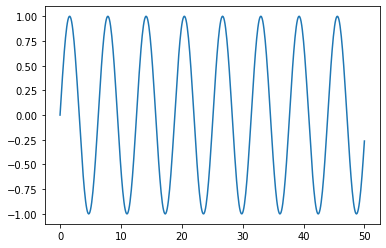

In [9]:
plt.plot(x,y)

Let's turn this into a DataFrame

In [10]:
df = pd.DataFrame(data=y,index=x,columns=['Sine'])

In [11]:
df

,Sine
0.0,0.000000
0.1,0.099833
0.2,0.198669
0.3,0.295520
0.4,0.389418
...,...
49.6,-0.617439
49.7,-0.535823
49.8,-0.448854
49.9,-0.357400


## Train Test Split

Note! This is very different from our usual test/train split methodology!

In [12]:
len(df)

501

In [13]:
test_percent = 0.1

In [14]:
len(df)*test_percent

50.1

In [15]:
test_point = np.round(len(df)*test_percent)

In [16]:
test_ind = int(len(df) - test_point)

In [17]:
test_ind

451

In [18]:
train = df.iloc[:test_ind]
test = df.iloc[test_ind:]

In [19]:
train

,Sine
0.0,0.000000
0.1,0.099833
0.2,0.198669
0.3,0.295520
0.4,0.389418
...,...
44.6,0.579164
44.7,0.657656
44.8,0.729577
44.9,0.794208


In [20]:
test

,Sine
45.1,0.899097
45.2,0.938307
45.3,0.968142
45.4,0.988304
45.5,0.998591
45.6,0.998900
45.7,0.989229
45.8,0.969673
45.9,0.940429
46.0,0.901788


## Scale Data

In [21]:
from sklearn.preprocessing import MinMaxScaler

In [22]:
scaler = MinMaxScaler()

In [23]:
# IGNORE WARNING ITS JUST CONVERTING TO FLOATS
# WE ONLY FIT TO TRAININ DATA, OTHERWISE WE ARE CHEATING ASSUMING INFO ABOUT TEST SET
scaler.fit(train)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [24]:
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

## Time Series Generator

This class takes in a sequence of data-points gathered at
equal intervals, along with time series parameters such as
stride, length of history, etc., to produce batches for
training/validation.

#### Arguments
    data: Indexable generator (such as list or Numpy array)
        containing consecutive data points (timesteps).
        The data should be at 2D, and axis 0 is expected
        to be the time dimension.
    targets: Targets corresponding to timesteps in `data`.
        It should have same length as `data`.
    length: Length of the output sequences (in number of timesteps).
    sampling_rate: Period between successive individual timesteps
        within sequences. For rate `r`, timesteps
        `data[i]`, `data[i-r]`, ... `data[i - length]`
        are used for create a sample sequence.
    stride: Period between successive output sequences.
        For stride `s`, consecutive output samples would
        be centered around `data[i]`, `data[i+s]`, `data[i+2*s]`, etc.
    start_index: Data points earlier than `start_index` will not be used
        in the output sequences. This is useful to reserve part of the
        data for test or validation.
    end_index: Data points later than `end_index` will not be used
        in the output sequences. This is useful to reserve part of the
        data for test or validation.
    shuffle: Whether to shuffle output samples,
        or instead draw them in chronological order.
    reverse: Boolean: if `true`, timesteps in each output sample will be
        in reverse chronological order.
    batch_size: Number of timeseries samples in each batch
        (except maybe the last one).

In [25]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [26]:
scaled_train

array([[4.99999116e-01],
       [5.49916225e-01],
       [5.99334579e-01],
       [6.47760405e-01],
       [6.94709850e-01],
       [7.39713809e-01],
       [7.82322618e-01],
       [8.22110545e-01],
       [8.58680040e-01],
       [8.91665714e-01],
       [9.20737985e-01],
       [9.45606372e-01],
       [9.66022399e-01],
       [9.81782075e-01],
       [9.92727935e-01],
       [9.98750612e-01],
       [9.99789928e-01],
       [9.95835500e-01],
       [9.86926839e-01],
       [9.73152957e-01],
       [9.54651478e-01],
       [9.31607263e-01],
       [9.04250562e-01],
       [8.72854714e-01],
       [8.37733417e-01],
       [7.99237589e-01],
       [7.57751870e-01],
       [7.13690771e-01],
       [6.67494535e-01],
       [6.19624741e-01],
       [5.70559686e-01],
       [5.20789614e-01],
       [4.70811810e-01],
       [4.21125636e-01],
       [3.72227539e-01],
       [3.24606094e-01],
       [2.78737119e-01],
       [2.35078919e-01],
       [1.94067715e-01],
       [1.56113277e-01],


Try to use the length of one complete cycle or if its a yearly trend use 12months

In [27]:
# define generator
length = 25 # Length of the output sequences (in number of timesteps)
batch_size = 1 #Number of timeseries samples in each batch
#we are telling it to take 25 points in order from train data and predict the next one point and so on
generator = TimeseriesGenerator(scaled_train, scaled_train, length=length, batch_size=batch_size)

In [28]:
len(scaled_train)

451

In [29]:
len(generator) #451-25..since we cant grad next 2 points after last 2 points

426

In [30]:
# scaled_train

In [31]:
# What does the first batch look like?
X,y = generator[0]

In [32]:
print(f'Given the Array: \n{X.flatten()}')
print(f'Predict this y: \n {y}')

Given the Array: 
[0.49999912 0.54991622 0.59933458 0.64776041 0.69470985 0.73971381
 0.78232262 0.82211054 0.85868004 0.89166571 0.92073798 0.94560637
 0.9660224  0.98178208 0.99272794 0.99875061 0.99978993 0.9958355
 0.98692684 0.97315296 0.95465148 0.93160726 0.90425056 0.87285471
 0.83773342]
Predict this y: 
 [[0.79923759]]


In [33]:
# Let's redefine to get 50 steps back and then predict the next step out
length = 50 # Length of the output sequences (in number of timesteps)
generator = TimeseriesGenerator(scaled_train, scaled_train, length=length, batch_size=1)

In [34]:
# What does the first batch look like?
X,y = generator[0]

In [35]:
print(f'Given the Array: \n{X.flatten()}')
print(f'Predict this y: \n {y}')

Given the Array: 
[4.99999116e-01 5.49916225e-01 5.99334579e-01 6.47760405e-01
 6.94709850e-01 7.39713809e-01 7.82322618e-01 8.22110545e-01
 8.58680040e-01 8.91665714e-01 9.20737985e-01 9.45606372e-01
 9.66022399e-01 9.81782075e-01 9.92727935e-01 9.98750612e-01
 9.99789928e-01 9.95835500e-01 9.86926839e-01 9.73152957e-01
 9.54651478e-01 9.31607263e-01 9.04250562e-01 8.72854714e-01
 8.37733417e-01 7.99237589e-01 7.57751870e-01 7.13690771e-01
 6.67494535e-01 6.19624741e-01 5.70559686e-01 5.20789614e-01
 4.70811810e-01 4.21125636e-01 3.72227539e-01 3.24606094e-01
 2.78737119e-01 2.35078919e-01 1.94067715e-01 1.56113277e-01
 1.21594831e-01 9.08572769e-02 6.42077324e-02 4.19124713e-02
 2.41942605e-02 1.12301346e-02 3.14962674e-03 3.34747619e-05
 1.91281421e-03 8.76886734e-03]
Predict this y: 
 [[0.02053313]]


Now you will be able to edit the length so that it makes sense for your time series!

### Create the Model

In [36]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM,SimpleRNN

In [37]:
# We're only using one feature in our time series ( we are using x to predict y)
n_features = 1

In [38]:
# define model
model = Sequential()

# Simple RNN layer
model.add(SimpleRNN(50,input_shape=(length, n_features)))  #lets use no of nuerons equal to batch length

# Final Prediction
model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')

In [39]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn (SimpleRNN)       (None, 50)                2600      
_________________________________________________________________
dense (Dense)                (None, 1)                 51        
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________


In [40]:
# fit model
model.fit_generator(generator,epochs=5)

Epoch 1/5


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


401/401 [==============================] - 4s 7ms/step - loss: 0.0216
Epoch 2/5
401/401 [==============================] - 3s 7ms/step - loss: 9.0482e-05
Epoch 3/5
401/401 [==============================] - 3s 7ms/step - loss: 1.0473e-04
Epoch 4/5
401/401 [==============================] - 3s 7ms/step - loss: 5.0944e-04
Epoch 5/5
401/401 [==============================] - 3s 7ms/step - loss: 1.4488e-04


In [41]:
model.history.history.keys()

dict_keys(['loss'])

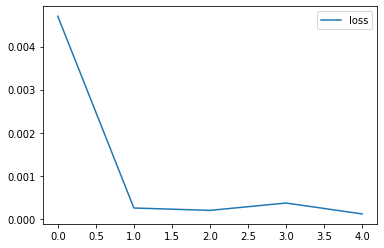

In [42]:
losses = pd.DataFrame(model.history.history)
losses.plot()

## Evaluate on Test Data

In [43]:
first_eval_batch = scaled_train[-length:]

In [44]:
first_eval_batch

array([[8.37405820e-01],
       [7.98881698e-01],
       [7.57371240e-01],
       [7.13289205e-01],
       [6.67076045e-01],
       [6.19193508e-01],
       [5.70120021e-01],
       [5.20345908e-01],
       [4.70368497e-01],
       [4.20687145e-01],
       [3.71798252e-01],
       [3.24190300e-01],
       [2.78338972e-01],
       [2.34702398e-01],
       [1.93716581e-01],
       [1.55791039e-01],
       [1.21304709e-01],
       [9.06021693e-02],
       [6.39901882e-02],
       [4.17346643e-02],
       [2.40579672e-02],
       [1.11367167e-02],
       [3.10001778e-03],
       [2.81703720e-05],
       [1.95186738e-03],
       [8.85188786e-03],
       [2.06592891e-02],
       [3.72560954e-02],
       [5.84764771e-02],
       [8.41084070e-02],
       [1.13895779e-01],
       [1.47540969e-01],
       [1.84707803e-01],
       [2.25024924e-01],
       [2.68089497e-01],
       [3.13471233e-01],
       [3.60716695e-01],
       [4.09353821e-01],
       [4.58896644e-01],
       [5.08850150e-01],


In [45]:
first_eval_batch = first_eval_batch.reshape((1, length, n_features))

In [46]:
model.predict(first_eval_batch)

array([[0.94707614]], dtype=float32)

In [47]:
scaled_test[0]

array([0.94955134])

Now let's put this logic in a for loop to predict into the future for the entire test range.

----

In [48]:
#test_predictions = []

#first_eval_batch = scaled_train[-length:]
#current_batch = first_eval_batch.reshape((1, length, n_features))

In [49]:
#current_batch.shape

In [50]:
#current_batch

In [51]:
#np.append(current_batch[:,1:,:],[[[99]]],axis=1)

**NOTE: PAY CLOSE ATTENTION HERE TO WHAT IS BEING OUTPUTED AND IN WHAT DIMENSIONS. ADD YOUR OWN PRINT() STATEMENTS TO SEE WHAT IS TRULY GOING ON!!**

In [52]:
test_predictions = []

first_eval_batch = scaled_train[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    test_predictions.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [53]:
test_predictions

[array([0.94707614], dtype=float32),
 array([0.9660781], dtype=float32),
 array([0.9804059], dtype=float32),
 array([0.98925], dtype=float32),
 array([0.99299717], dtype=float32),
 array([0.99182755], dtype=float32),
 array([0.9857165], dtype=float32),
 array([0.97518086], dtype=float32),
 array([0.9596484], dtype=float32),
 array([0.93971014], dtype=float32),
 array([0.9158391], dtype=float32),
 array([0.88775575], dtype=float32),
 array([0.85564005], dtype=float32),
 array([0.82079524], dtype=float32),
 array([0.78255737], dtype=float32),
 array([0.7416867], dtype=float32),
 array([0.698409], dtype=float32),
 array([0.6533084], dtype=float32),
 array([0.6066242], dtype=float32),
 array([0.5588224], dtype=float32),
 array([0.5103615], dtype=float32),
 array([0.4616435], dtype=float32),
 array([0.41330004], dtype=float32),
 array([0.36587325], dtype=float32),
 array([0.31950486], dtype=float32),
 array([0.2753807], dtype=float32),
 array([0.233342], dtype=float32),
 array([0.19412884],

In [54]:
scaled_test

array([[9.49551344e-01],
       [9.69156618e-01],
       [9.84074225e-01],
       [9.94155114e-01],
       [9.99298559e-01],
       [9.99453170e-01],
       [9.94617400e-01],
       [9.84839568e-01],
       [9.70217371e-01],
       [9.50896908e-01],
       [9.27071224e-01],
       [8.98978376e-01],
       [8.66899060e-01],
       [8.31153800e-01],
       [7.92099752e-01],
       [7.50127132e-01],
       [7.05655314e-01],
       [6.59128649e-01],
       [6.11012013e-01],
       [5.61786173e-01],
       [5.11942978e-01],
       [4.61980443e-01],
       [4.12397778e-01],
       [3.63690397e-01],
       [3.16344967e-01],
       [2.70834550e-01],
       [2.27613868e-01],
       [1.87114770e-01],
       [1.49741909e-01],
       [1.15868702e-01],
       [8.58335998e-02],
       [5.99367021e-02],
       [3.84367625e-02],
       [2.15486014e-02],
       [9.44095974e-03],
       [2.23481297e-03],
       [2.16257798e-06],
       [2.76531647e-03],
       [1.04966661e-02],
       [2.31189624e-02],


## Inverse Transformations and Compare

In [55]:
true_predictions = scaler.inverse_transform(test_predictions)

In [56]:
true_predictions

array([[ 0.89414688],
       [ 0.93215049],
       [ 0.96080591],
       [ 0.97849392],
       [ 0.98598819],
       [ 0.98364897],
       [ 0.97142702],
       [ 0.95035587],
       [ 0.91929113],
       [ 0.87941499],
       [ 0.83167325],
       [ 0.77550705],
       [ 0.71127617],
       [ 0.6415871 ],
       [ 0.56511197],
       [ 0.48337129],
       [ 0.39681663],
       [ 0.30661609],
       [ 0.21324843],
       [ 0.11764561],
       [ 0.02072459],
       [-0.07671064],
       [-0.17339677],
       [-0.26824958],
       [-0.36098562],
       [-0.44923322],
       [-0.53330994],
       [-0.61173564],
       [-0.68352603],
       [-0.74807206],
       [-0.80525836],
       [-0.85369461],
       [-0.89369108],
       [-0.92431604],
       [-0.94573006],
       [-0.95765481],
       [-0.96003844],
       [-0.95273086],
       [-0.93601088],
       [-0.90968299],
       [-0.87455498],
       [-0.83055499],
       [-0.77883731],
       [-0.71908227],
       [-0.65238482],
       [-0

In [57]:
test

,Sine
45.1,0.899097
45.2,0.938307
45.3,0.968142
45.4,0.988304
45.5,0.998591
45.6,0.998900
45.7,0.989229
45.8,0.969673
45.9,0.940429
46.0,0.901788


In [58]:
# IGNORE WARNINGS
test['Predictions'] = true_predictions

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [59]:
test

,Sine,Predictions
45.1,0.899097,0.894147
45.2,0.938307,0.932150
45.3,0.968142,0.960806
45.4,0.988304,0.978494
45.5,0.998591,0.985988
45.6,0.998900,0.983649
45.7,0.989229,0.971427
45.8,0.969673,0.950356
45.9,0.940429,0.919291
46.0,0.901788,0.879415


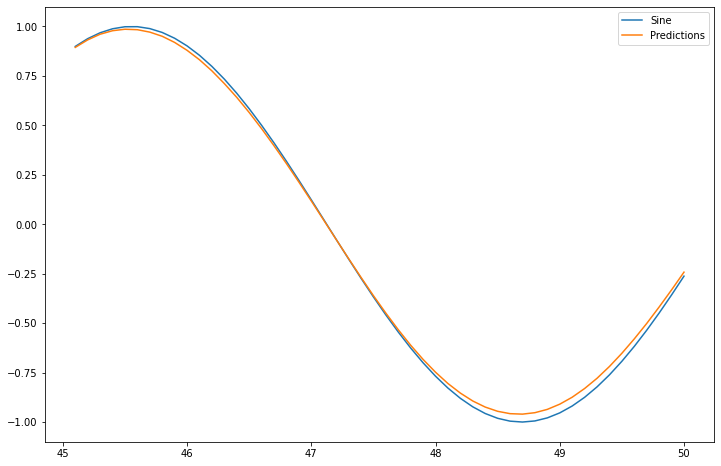

In [60]:
test.plot(figsize=(12,8))

## Adding in Early Stopping and Validation Generator

In [1]:
from tensorflow.keras.callbacks import EarlyStopping

In [2]:
early_stop = EarlyStopping(monitor='val_loss',patience=2)

In [61]:
length = 49  #should be atleast 1less than the test test, for the model to get evaluated
generator = TimeseriesGenerator(scaled_train,scaled_train,
                               length=length,batch_size=1)


validation_generator = TimeseriesGenerator(scaled_test,scaled_test,
                                          length=length,batch_size=1)

## LSTMS

In [62]:
# define model
model = Sequential()

# Simple RNN layer
model.add(LSTM(50,input_shape=(length, n_features)))

# Final Prediction
model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')

In [63]:
model.fit_generator(generator,epochs=20,
                   validation_data=validation_generator,
                   callbacks=[early_stop])

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
402/402 [==============================] - 10s 20ms/step - loss: 0.0519 - val_loss: 4.7809e-05
Epoch 2/20
402/402 [==============================] - 7s 19ms/step - loss: 1.3678e-04 - val_loss: 8.5079e-09
Epoch 3/20
402/402 [==============================] - 8s 19ms/step - loss: 1.2044e-04 - val_loss: 1.0179e-04
Epoch 4/20
402/402 [==============================] - 7s 17ms/step - loss: 8.6746e-05 - val_loss: 1.1925e-04


In [64]:
test_predictions = []

first_eval_batch = scaled_train[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    test_predictions.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


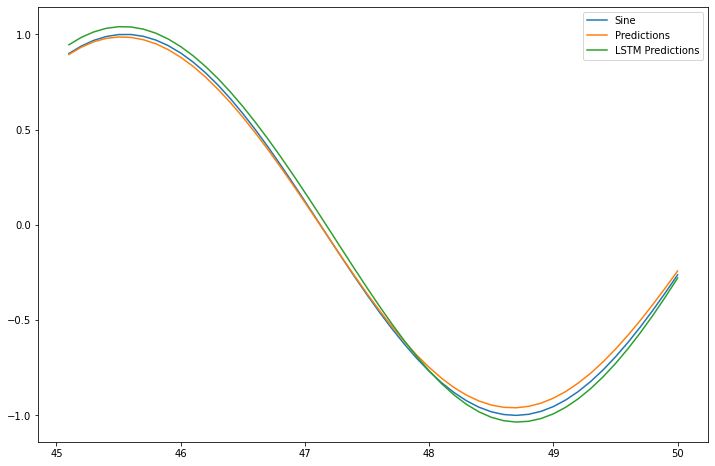

In [65]:
# IGNORE WARNINGS
true_predictions = scaler.inverse_transform(test_predictions)
test['LSTM Predictions'] = true_predictions
test.plot(figsize=(12,8))

## Forecasting

Forecast into unknown range. We should first utilize all our data, since we are now forecasting!

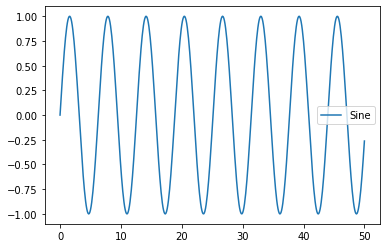

In [66]:
df.plot()

In [70]:
#scaling our full data set for future forecasting
full_scaler = MinMaxScaler()
scaled_full_data = full_scaler.fit_transform(df)

In [71]:
length = 50 # Length of the output sequences (in number of timesteps)
generator = TimeseriesGenerator(scaled_full_data, scaled_full_data, length=length, batch_size=1)

In [72]:
model = Sequential()
model.add(LSTM(50, input_shape=(length, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit_generator(generator,epochs=4)  #since we have seen early stoppping at 4 epochs

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/4
451/451 [==============================] - 10s 18ms/step - loss: 0.0584
Epoch 2/4
451/451 [==============================] - 9s 20ms/step - loss: 1.8743e-04
Epoch 3/4
451/451 [==============================] - 9s 20ms/step - loss: 1.7178e-04
Epoch 4/4
451/451 [==============================] - 8s 19ms/step - loss: 1.0891e-04


In [73]:
forecast = []

first_eval_batch = scaled_full_data[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    forecast.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [74]:
forecast = scaler.inverse_transform(forecast)

In [76]:
forecast

array([[-0.17647419],
       [-0.07687914],
       [ 0.02374831],
       [ 0.1245163 ],
       [ 0.22450277],
       [ 0.32270993],
       [ 0.41809257],
       [ 0.50958973],
       [ 0.59614762],
       [ 0.67675439],
       [ 0.75046662],
       [ 0.81643604],
       [ 0.87393451],
       [ 0.92237076],
       [ 0.96129919],
       [ 0.99042918],
       [ 1.00961386],
       [ 1.01884726],
       [ 1.01824573],
       [ 1.00803387],
       [ 0.98852542],
       [ 0.9601033 ],
       [ 0.92320832],
       [ 0.87832066],
       [ 0.82595125],
       [ 0.76663413],
       [ 0.70092292],
       [ 0.62939077],
       [ 0.55262752],
       [ 0.471249  ],
       [ 0.38589798],
       [ 0.29725204],
       [ 0.20602643],
       [ 0.11298123],
       [ 0.01891965],
       [-0.07530953],
       [-0.16881917],
       [-0.26068927],
       [-0.34998204],
       [-0.43575559],
       [-0.51708372],
       [-0.59307557],
       [-0.66289577],
       [-0.72578446],
       [-0.78107315],
       [-0

In [75]:
df

,Sine
0.0,0.000000
0.1,0.099833
0.2,0.198669
0.3,0.295520
0.4,0.389418
...,...
49.6,-0.617439
49.7,-0.535823
49.8,-0.448854
49.9,-0.357400


In [77]:
len(forecast)

50

In [78]:
50*0.1

5.0

In [79]:
forecast_index = np.arange(50.1,55.1,step=0.1)

In [80]:
len(forecast_index)

50

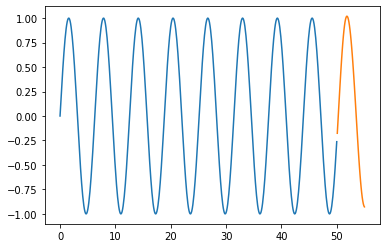

In [81]:
plt.plot(df.index,df['Sine'])
plt.plot(forecast_index,forecast)

# RNN - Time Series Forecasting

In [82]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt

## Data

Release: Advance Monthly Sales for Retail and Food Services  
Units:  Millions of Dollars, Not Seasonally Adjusted

Frequency:  Monthly

The value for the most recent month is an advance estimate that is based on data from a subsample of firms from the larger Monthly Retail Trade Survey. The advance estimate will be superseded in following months by revised estimates derived from the larger Monthly Retail Trade Survey. The associated series from the Monthly Retail Trade Survey is available at https://fred.stlouisfed.org/series/MRTSSM448USN

Information about the Advance Monthly Retail Sales Survey can be found on the Census website at https://www.census.gov/retail/marts/about_the_surveys.html

Suggested Citation:
U.S. Census Bureau, Advance Retail Sales: Clothing and Clothing Accessory Stores [RSCCASN], retrieved from FRED, Federal Reserve Bank of St. Louis; https://fred.stlouisfed.org/series/RSCCASN, November 16, 2019.

https://fred.stlouisfed.org/series/RSCCASN

In [83]:
from google.colab import files
files.upload()

Saving RSCCASN.csv to RSCCASN.csv


{'RSCCASN.csv': b'DATE,RSCCASN\r\n1992-01-01,6938\r\n1992-02-01,7524\r\n1992-03-01,8475\r\n1992-04-01,9401\r\n1992-05-01,9558\r\n1992-06-01,9182\r\n1992-07-01,9103\r\n1992-08-01,10513\r\n1992-09-01,9573\r\n1992-10-01,10254\r\n1992-11-01,11187\r\n1992-12-01,18395\r\n1993-01-01,7502\r\n1993-02-01,7524\r\n1993-03-01,8766\r\n1993-04-01,9867\r\n1993-05-01,10063\r\n1993-06-01,9635\r\n1993-07-01,9794\r\n1993-08-01,10628\r\n1993-09-01,10013\r\n1993-10-01,10346\r\n1993-11-01,11760\r\n1993-12-01,18851\r\n1994-01-01,7280\r\n1994-02-01,7902\r\n1994-03-01,9921\r\n1994-04-01,9869\r\n1994-05-01,10009\r\n1994-06-01,9893\r\n1994-07-01,9735\r\n1994-08-01,11157\r\n1994-09-01,10217\r\n1994-10-01,10730\r\n1994-11-01,12354\r\n1994-12-01,20016\r\n1995-01-01,7518\r\n1995-02-01,7961\r\n1995-03-01,9815\r\n1995-04-01,10168\r\n1995-05-01,10620\r\n1995-06-01,10301\r\n1995-07-01,9784\r\n1995-08-01,11264\r\n1995-09-01,10710\r\n1995-10-01,10439\r\n1995-11-01,12751\r\n1995-12-01,20002\r\n1996-01-01,7684\r\n1996-02-01,

In [84]:
df = pd.read_csv('RSCCASN.csv',index_col='DATE',parse_dates=True)  #parse dates will automatically assign datetime format to date column if its assigned to any other format earlier

In [85]:
df.head()

,RSCCASN
DATE,
1992-01-01,6938
1992-02-01,7524
1992-03-01,8475
1992-04-01,9401
1992-05-01,9558


In [86]:
df.columns = ['Sales']

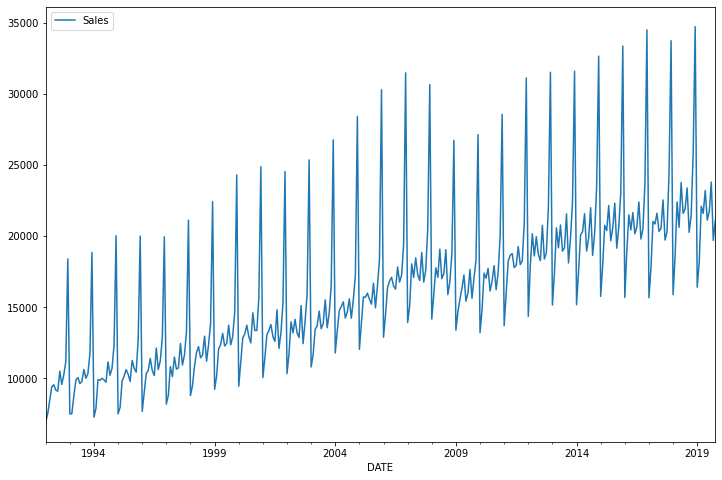

In [87]:
df.plot(figsize=(12,8))

## Train Test Split

In [88]:
len(df)

334

Data is monthly, let's forecast 1.5 years into the future.

In [89]:
len(df)- 18

316

In [90]:
test_size = 18

In [91]:
test_ind = len(df)- test_size

In [92]:
train = df.iloc[:test_ind]
test = df.iloc[test_ind:]

In [93]:
train

,Sales
DATE,
1992-01-01,6938
1992-02-01,7524
1992-03-01,8475
1992-04-01,9401
1992-05-01,9558
...,...
2017-12-01,33720
2018-01-01,15881
2018-02-01,18585


In [94]:
test

,Sales
DATE,
2018-05-01,23764
2018-06-01,21589
2018-07-01,21919
2018-08-01,23381
2018-09-01,20260
2018-10-01,21473
2018-11-01,25831
2018-12-01,34706
2019-01-01,16410


## Scale Data

In [95]:
from sklearn.preprocessing import MinMaxScaler

In [96]:
scaler = MinMaxScaler()

In [97]:
# IGNORE WARNING ITS JUST CONVERTING TO FLOATS
# WE ONLY FIT TO TRAININ DATA, OTHERWISE WE ARE CHEATING ASSUMING INFO ABOUT TEST SET
scaler.fit(train)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [98]:
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

## Time Series Generator

This class takes in a sequence of data-points gathered at
equal intervals, along with time series parameters such as
stride, length of history, etc., to produce batches for
training/validation.

#### Arguments
    data: Indexable generator (such as list or Numpy array)
        containing consecutive data points (timesteps).
        The data should be at 2D, and axis 0 is expected
        to be the time dimension.
    targets: Targets corresponding to timesteps in `data`.
        It should have same length as `data`.
    length: Length of the output sequences (in number of timesteps).
    sampling_rate: Period between successive individual timesteps
        within sequences. For rate `r`, timesteps
        `data[i]`, `data[i-r]`, ... `data[i - length]`
        are used for create a sample sequence.
    stride: Period between successive output sequences.
        For stride `s`, consecutive output samples would
        be centered around `data[i]`, `data[i+s]`, `data[i+2*s]`, etc.
    start_index: Data points earlier than `start_index` will not be used
        in the output sequences. This is useful to reserve part of the
        data for test or validation.
    end_index: Data points later than `end_index` will not be used
        in the output sequences. This is useful to reserve part of the
        data for test or validation.
    shuffle: Whether to shuffle output samples,
        or instead draw them in chronological order.
    reverse: Boolean: if `true`, timesteps in each output sample will be
        in reverse chronological order.
    batch_size: Number of timeseries samples in each batch
        (except maybe the last one).

In [99]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [100]:
# Let's redefine to get 12 months back and then predict the next month out
length = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=length, batch_size=1)

In [101]:
# What does the first batch look like?
X,y = generator[0]

In [102]:
print(f'Given the Array: \n{X.flatten()}')
print(f'Predict this y: \n {y}')

Given the Array: 
[0.         0.02127505 0.05580163 0.08942056 0.09512053 0.08146965
 0.07860151 0.12979233 0.09566512 0.1203892  0.15426227 0.41595266]
Predict this y: 
 [[0.02047633]]


### Create the Model

In [103]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM

In [104]:
# We're only using one feature in our time series
n_features = 1

In [116]:
# define model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(length, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [106]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 100)               40800     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 101       
Total params: 40,901
Trainable params: 40,901
Non-trainable params: 0
_________________________________________________________________


### EarlyStopping and creating a Validation Generator

NOTE: The scaled_test dataset size MUST be greater than your length chosen for your batches. Review video for more info on this.

In [117]:
from tensorflow.keras.callbacks import EarlyStopping

In [118]:
early_stop = EarlyStopping(monitor='val_loss',patience=4)

In [119]:
validation_generator = TimeseriesGenerator(scaled_test,scaled_test, length=length, batch_size=1)

In [120]:
# fit model
model.fit_generator(generator,epochs=20,
                    validation_data=validation_generator,
                   callbacks=[early_stop])

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
304/304 [==============================] - 3s 7ms/step - loss: 0.0405 - val_loss: 0.0061
Epoch 2/20
304/304 [==============================] - 2s 5ms/step - loss: 0.0228 - val_loss: 0.0022
Epoch 3/20
304/304 [==============================] - 2s 5ms/step - loss: 0.0100 - val_loss: 0.0103
Epoch 4/20
304/304 [==============================] - 2s 6ms/step - loss: 0.0059 - val_loss: 0.0043
Epoch 5/20
304/304 [==============================] - 2s 5ms/step - loss: 0.0048 - val_loss: 0.0043
Epoch 6/20
304/304 [==============================] - 2s 6ms/step - loss: 0.0033 - val_loss: 6.9809e-04
Epoch 7/20
304/304 [==============================] - 2s 6ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 8/20
304/304 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0032
Epoch 9/20
304/304 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 7.5128e-04
Epoch 10/20
304/304 [==============================] - 2s 5ms/step - loss: 0.0020 - val_loss

In [121]:
losses = pd.DataFrame(model.history.history)

In [130]:
losses

,loss,val_loss
0,0.025621,0.006078
1,0.017981,0.002243
2,0.009559,0.010329
3,0.004375,0.004300
4,0.003207,0.004258
5,0.003011,0.000698
6,0.002128,0.001798
7,0.002336,0.003156
8,0.001412,0.000751
9,0.001917,0.002125


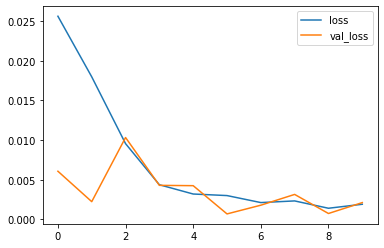

In [122]:
losses.plot()

## Evaluate on Test Data

In [ ]:
first_eval_batch = scaled_train[-length:]

In [ ]:
first_eval_batch = first_eval_batch.reshape((1, n_input, n_features))

In [ ]:
model.predict(first_eval_batch)

In [ ]:
scaled_test[0]

Now let's put this logic in a for loop to predict into the future for the entire test range.

----

**NOTE: PAY CLOSE ATTENTION HERE TO WHAT IS BEING OUTPUTED AND IN WHAT DIMENSIONS. ADD YOUR OWN PRINT() STATEMENTS TO SEE WHAT IS TRULY GOING ON!!**

In [123]:
test_predictions = []

first_eval_batch = scaled_train[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    test_predictions.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

## Inverse Transformations and Compare

In [124]:
true_predictions = scaler.inverse_transform(test_predictions)

In [125]:
# IGNORE WARNINGS
test['Predictions'] = true_predictions

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [126]:
test

,Sales,Predictions
DATE,,
2018-05-01,23764,22421.685616
2018-06-01,21589,21352.004827
2018-07-01,21919,21579.958578
2018-08-01,23381,23286.157465
2018-09-01,20260,20929.896040
2018-10-01,21473,21505.940264
2018-11-01,25831,25243.662359
2018-12-01,34706,35208.996600
2019-01-01,16410,16849.974072


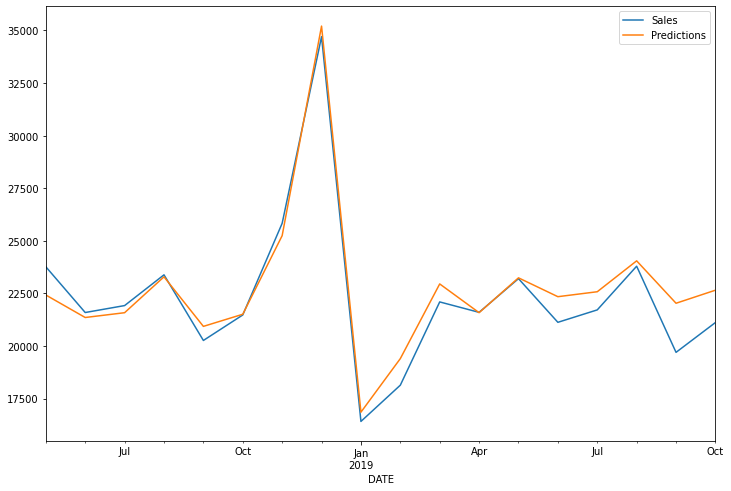

In [127]:
test.plot(figsize=(12,8))

## Retrain and Forecasting

In [128]:
full_scaler = MinMaxScaler()
scaled_full_data = full_scaler.fit_transform(df)

In [129]:
length = 12 # Length of the output sequences (in number of timesteps)
generator = TimeseriesGenerator(scaled_full_data, scaled_full_data, length=length, batch_size=1)

we are not able to use early stop while forecasting becoz we dont have validation data, since we are using entire data set for training

In [131]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(length, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')


# fit model
model.fit_generator(generator,epochs=8)  #based on te early stooping from train data earlier

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/8
322/322 [==============================] - 3s 5ms/step - loss: 0.0481
Epoch 2/8
322/322 [==============================] - 2s 5ms/step - loss: 0.0168
Epoch 3/8
322/322 [==============================] - 2s 5ms/step - loss: 0.0113
Epoch 4/8
322/322 [==============================] - 2s 5ms/step - loss: 0.0033
Epoch 5/8
322/322 [==============================] - 2s 5ms/step - loss: 0.0040
Epoch 6/8
322/322 [==============================] - 2s 5ms/step - loss: 0.0026
Epoch 7/8
322/322 [==============================] - 2s 6ms/step - loss: 0.0018
Epoch 8/8
322/322 [==============================] - 2s 5ms/step - loss: 0.0022


In [132]:
forecast = []
# Replace periods with whatever forecast length you want
periods = 12

first_eval_batch = scaled_full_data[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(periods):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    forecast.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [133]:
forecast = scaler.inverse_transform(forecast)

### Creating new timestamp index with pandas.

In [134]:
df

,Sales
DATE,
1992-01-01,6938
1992-02-01,7524
1992-03-01,8475
1992-04-01,9401
1992-05-01,9558
...,...
2019-06-01,21123
2019-07-01,21714
2019-08-01,23791


In [135]:
forecast_index = pd.date_range(start='2019-11-01',periods=periods,freq='MS')

In [136]:
forecast_df = pd.DataFrame(data=forecast,index=forecast_index,
                           columns=['Forecast'])

In [137]:
forecast_df

,Forecast
2019-11-01,25647.948304
2019-12-01,34518.148059
2020-01-01,16748.278310
2020-02-01,18338.661561
2020-03-01,21794.494303
2020-04-01,21411.130824
2020-05-01,22883.478793
2020-06-01,21059.682971
2020-07-01,21641.497947
2020-08-01,23497.616549


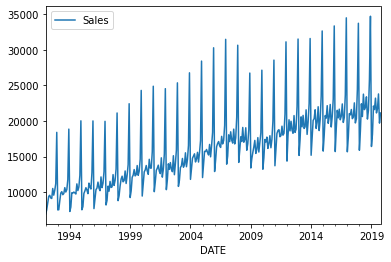

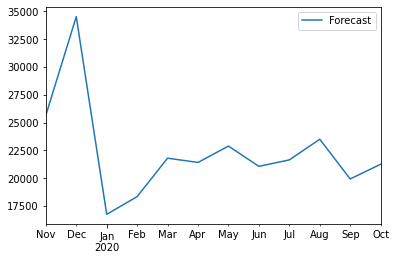

In [138]:
df.plot()
forecast_df.plot()

### Joining pandas plots

https://stackoverflow.com/questions/13872533/plot-different-dataframes-in-the-same-figure

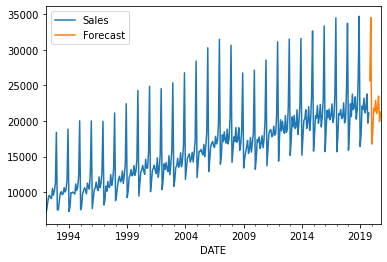

In [139]:
ax = df.plot()
forecast_df.plot(ax=ax)

(576.0, 611.0)

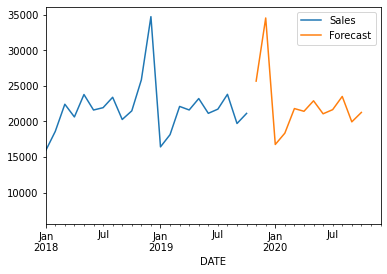

In [140]:
ax = df.plot()
forecast_df.plot(ax=ax)
plt.xlim('2018-01-01','2020-12-01')

# RNN - Ice cream and frozen dessert production index forecast

**TASK: IMPORT THE BASIC LIBRARIES YOU THINK YOU WILL USE**

In [141]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

## Data

Info about this data set: https://fred.stlouisfed.org/series/IPN31152N


Units:  Index 2012=100, Not Seasonally Adjusted

Frequency:  Monthly

The industrial production (IP) index measures the real output of all relevant establishments located in the United States, regardless of their ownership, but not those located in U.S. territories.

NAICS = 31152

Source Code: IP.N31152.N

Suggested Citation:
Board of Governors of the Federal Reserve System (US), Industrial Production: Nondurable Goods: Ice cream and frozen dessert [IPN31152N], retrieved from FRED, Federal Reserve Bank of St. Louis; https://fred.stlouisfed.org/series/IPN31152N, November 16, 2019.

# Project Tasks

**TASK: Read in the data set "Frozen_Dessert_Production.csv" from the Data folder. Figure out how to set the date to a datetime index columns**

In [143]:
from google.colab import files
files.upload()

Saving Frozen_Dessert_Production.csv to Frozen_Dessert_Production.csv


{'Frozen_Dessert_Production.csv': b'DATE,IPN31152N\r\n1972-01-01,59.9622\r\n1972-02-01,67.0605\r\n1972-03-01,74.2350\r\n1972-04-01,78.1120\r\n1972-05-01,84.7636\r\n1972-06-01,100.5960\r\n1972-07-01,100.1263\r\n1972-08-01,96.3607\r\n1972-09-01,85.8007\r\n1972-10-01,70.3934\r\n1972-11-01,60.8072\r\n1972-12-01,58.6598\r\n1973-01-01,61.0996\r\n1973-02-01,72.2062\r\n1973-03-01,80.0984\r\n1973-04-01,83.9059\r\n1973-05-01,87.3712\r\n1973-06-01,109.7467\r\n1973-07-01,107.3748\r\n1973-08-01,99.6631\r\n1973-09-01,91.6272\r\n1973-10-01,75.3049\r\n1973-11-01,65.9342\r\n1973-12-01,61.5304\r\n1974-01-01,62.9796\r\n1974-02-01,75.3447\r\n1974-03-01,84.2683\r\n1974-04-01,84.5883\r\n1974-05-01,90.5395\r\n1974-06-01,109.9025\r\n1974-07-01,103.8903\r\n1974-08-01,101.0265\r\n1974-09-01,89.4762\r\n1974-10-01,73.6952\r\n1974-11-01,66.1573\r\n1974-12-01,61.0653\r\n1975-01-01,64.2659\r\n1975-02-01,75.4174\r\n1975-03-01,85.1690\r\n1975-04-01,85.0917\r\n1975-05-01,97.3552\r\n1975-06-01,113.5254\r\n1975-07-01,108

In [144]:
df = pd.read_csv('Frozen_Dessert_Production.csv',index_col='DATE',parse_dates=True)

In [145]:
df.head()

,IPN31152N
DATE,
1972-01-01,59.9622
1972-02-01,67.0605
1972-03-01,74.2350
1972-04-01,78.1120
1972-05-01,84.7636


**Task: Change the column name to Production**

In [146]:
df.columns = ['Production']

In [147]:
df.head()

,Production
DATE,
1972-01-01,59.9622
1972-02-01,67.0605
1972-03-01,74.2350
1972-04-01,78.1120
1972-05-01,84.7636


**TASK: Plot out the time series**

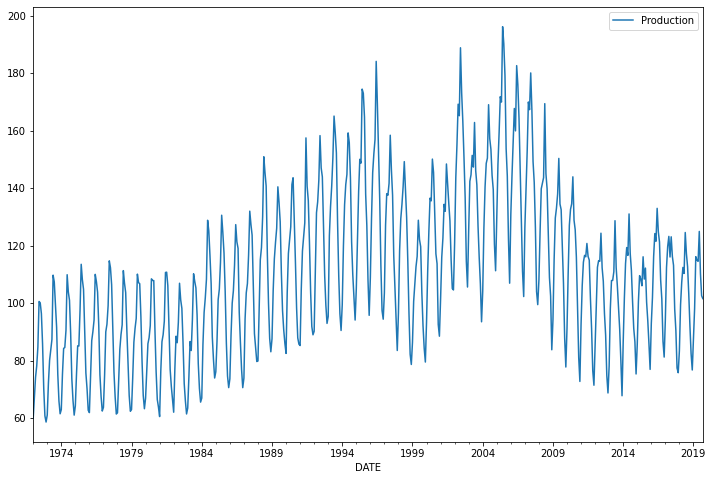

In [148]:
df.plot(figsize=(12,8))

## Train Test Split

**TASK: Figure out the length of the data set**

In [149]:
len(df)

573

**TASK: Split the data into a train/test split where the test set is the last 24 months of data.**

In [150]:
test_size = 24
test_ind = len(df)- test_size

In [151]:
train = df.iloc[:test_ind]
test = df.iloc[test_ind:]

In [152]:
len(test)

24

## Scale Data

**TASK: Use a MinMaxScaler to scale the train and test sets into scaled versions.**

In [153]:
from sklearn.preprocessing import MinMaxScaler

In [154]:
scaler = MinMaxScaler()

In [155]:
# IGNORE WARNING ITS JUST CONVERTING TO FLOATS
# WE ONLY FIT TO TRAININ DATA, OTHERWISE WE ARE CHEATING ASSUMING INFO ABOUT TEST SET
scaler.fit(train)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [156]:
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

## Time Series Generator

**TASK: Create a TimeSeriesGenerator object based off the scaled_train data. The batch length is up to you, but at a minimum it should be at least 18 to capture a full year seasonality.**

In [158]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [159]:
length = 18
n_features=1
generator = TimeseriesGenerator(scaled_train, scaled_train, length=length, batch_size=1)

### Create the Model

**TASK: Create a Keras Sequential Model with as many LSTM units you want and a final Dense Layer.**

In [160]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM

In [168]:
# define model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(length, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [163]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 100)               40800     
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 101       
Total params: 40,901
Trainable params: 40,901
Non-trainable params: 0
_________________________________________________________________


**TASK: Create a generator for the scaled test/validation set. NOTE: Double check that your batch length makes sense for the size of the test set as mentioned in the RNN Time Series video.**

In [164]:
validation_generator = TimeseriesGenerator(scaled_test,scaled_test, length=length, batch_size=1)

**TASK: Create an EarlyStopping callback based on val_loss.**

In [165]:
from tensorflow.keras.callbacks import EarlyStopping

In [169]:
early_stop = EarlyStopping(monitor='val_loss',patience=4)

**TASK: Fit the model to the generator, let the EarlyStopping dictate the amount of epochs, so feel free to set the parameter high.**

In [170]:
# fit model
model.fit_generator(generator,epochs=20,
                    validation_data=validation_generator,
                   callbacks=[early_stop])

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
531/531 [==============================] - 5s 8ms/step - loss: 0.0437 - val_loss: 0.0065
Epoch 2/20
531/531 [==============================] - 4s 7ms/step - loss: 0.0115 - val_loss: 0.0033
Epoch 3/20
531/531 [==============================] - 4s 7ms/step - loss: 0.0057 - val_loss: 0.0014
Epoch 4/20
531/531 [==============================] - 4s 7ms/step - loss: 0.0038 - val_loss: 0.0026
Epoch 5/20
531/531 [==============================] - 4s 8ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 6/20
531/531 [==============================] - 4s 7ms/step - loss: 0.0031 - val_loss: 0.0023
Epoch 7/20
531/531 [==============================] - 4s 7ms/step - loss: 0.0028 - val_loss: 0.0039


**TASK: Plot the history of the loss that occured during training.**

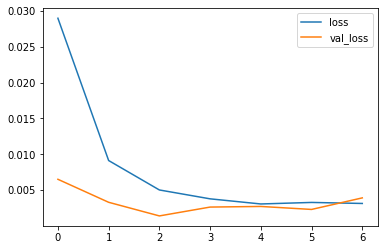

In [171]:
loss = pd.DataFrame(model.history.history)
loss.plot()

## Evaluate on Test Data

**TASK: Forecast predictions for your test data range (the last 12 months of the entire dataset). Remember to inverse your scaling transformations. Your final result should be a DataFrame with two columns, the true test values and the predictions.**

In [172]:
test_predictions = []

first_eval_batch = scaled_train[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    test_predictions.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [173]:
true_predictions = scaler.inverse_transform(test_predictions)

In [174]:
test['Predictions'] = true_predictions

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [175]:
test

,Production,Predictions
DATE,,
2017-10-01,90.4732,91.264873
2017-11-01,77.4378,87.191766
2017-12-01,75.8118,89.520321
2018-01-01,83.4343,101.434679
2018-02-01,99.4899,112.914478
2018-03-01,107.3152,122.037335
2018-04-01,112.4309,129.665205
2018-05-01,110.3544,135.848407
2018-06-01,124.5841,135.753336


**TASK: Plot your predictions versus the True test values. (Your plot may look different than ours).**

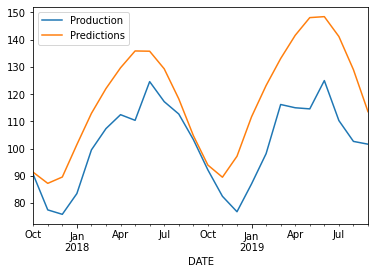

In [176]:
test.plot()

**TASK: Calculate your RMSE.**

In [177]:
from sklearn.metrics import mean_squared_error

In [178]:
np.sqrt(mean_squared_error(test['Production'],test['Predictions']))

18.732095889161332

##Lets try to improve the model

In [179]:
df = pd.read_csv('Frozen_Dessert_Production.csv',index_col='DATE',parse_dates=True)

In [180]:
df.head()

,IPN31152N
DATE,
1972-01-01,59.9622
1972-02-01,67.0605
1972-03-01,74.2350
1972-04-01,78.1120
1972-05-01,84.7636


**Task: Change the column name to Production**

In [181]:
df.columns = ['Production']

In [182]:
df.head()

,Production
DATE,
1972-01-01,59.9622
1972-02-01,67.0605
1972-03-01,74.2350
1972-04-01,78.1120
1972-05-01,84.7636


**TASK: Plot out the time series**

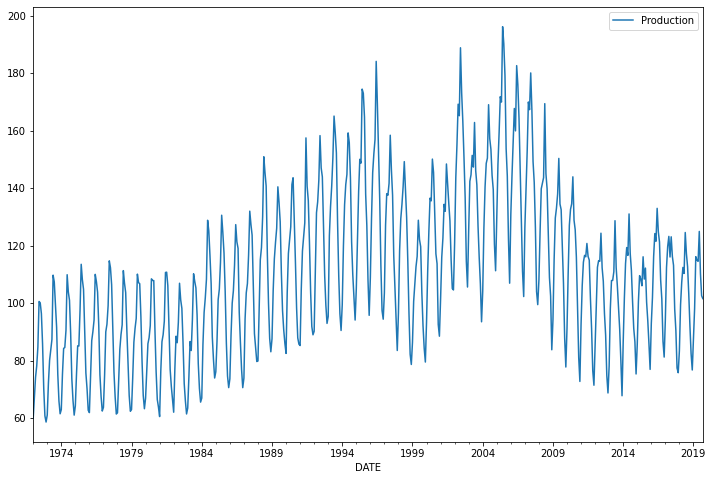

In [183]:
df.plot(figsize=(12,8))

## Train Test Split

**TASK: Figure out the length of the data set**

In [184]:
len(df)

573

**TASK: Split the data into a train/test split where the test set is the last 24 months of data.**

In [185]:
test_size = 18
test_ind = len(df)- test_size

In [186]:
train = df.iloc[:test_ind]
test = df.iloc[test_ind:]

In [187]:
len(test)

18

## Scale Data

**TASK: Use a MinMaxScaler to scale the train and test sets into scaled versions.**

In [188]:
from sklearn.preprocessing import MinMaxScaler

In [189]:
scaler = MinMaxScaler()

In [190]:
# IGNORE WARNING ITS JUST CONVERTING TO FLOATS
# WE ONLY FIT TO TRAININ DATA, OTHERWISE WE ARE CHEATING ASSUMING INFO ABOUT TEST SET
scaler.fit(train)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [191]:
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

## Time Series Generator

**TASK: Create a TimeSeriesGenerator object based off the scaled_train data. The batch length is up to you, but at a minimum it should be at least 18 to capture a full year seasonality.**

In [192]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [193]:
length = 12
n_features=1
generator = TimeseriesGenerator(scaled_train, scaled_train, length=length, batch_size=1)

### Create the Model

**TASK: Create a Keras Sequential Model with as many LSTM units you want and a final Dense Layer.**

In [222]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM

In [223]:
# define model
model = Sequential()
model.add(LSTM(200, activation='relu',input_shape=(length, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [224]:
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 200)               161600    
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 201       
Total params: 161,801
Trainable params: 161,801
Non-trainable params: 0
_________________________________________________________________


**TASK: Create a generator for the scaled test/validation set. NOTE: Double check that your batch length makes sense for the size of the test set as mentioned in the RNN Time Series video.**

In [225]:
validation_generator = TimeseriesGenerator(scaled_test,scaled_test, length=length, batch_size=1)

**TASK: Create an EarlyStopping callback based on val_loss.**

In [226]:
from tensorflow.keras.callbacks import EarlyStopping

In [227]:
early_stop = EarlyStopping(monitor='val_loss',patience=4)

**TASK: Fit the model to the generator, let the EarlyStopping dictate the amount of epochs, so feel free to set the parameter high.**

In [228]:
# fit model
model.fit_generator(generator,epochs=20,
                    validation_data=validation_generator,
                   callbacks=[early_stop])

Epoch 1/20


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


543/543 [==============================] - 7s 11ms/step - loss: 0.0306 - val_loss: 0.0021
Epoch 2/20
543/543 [==============================] - 6s 10ms/step - loss: 0.0095 - val_loss: 0.0026
Epoch 3/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0057 - val_loss: 0.0017
Epoch 4/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0053 - val_loss: 0.0018
Epoch 5/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0046 - val_loss: 0.0021
Epoch 6/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0043 - val_loss: 0.0015
Epoch 7/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0037 - val_loss: 0.0059
Epoch 8/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0038 - val_loss: 0.0022
Epoch 9/20
543/543 [==============================] - 5s 9ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 10/20
543/543 [==============================] - 5s 10ms/step - loss: 0.0032 - val_loss: 0.0027


**TASK: Plot the history of the loss that occured during training.**

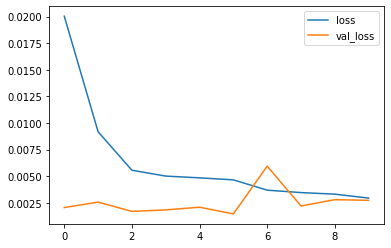

In [229]:
loss = pd.DataFrame(model.history.history)
loss.plot()

## Evaluate on Test Data

**TASK: Forecast predictions for your test data range (the last 12 months of the entire dataset). Remember to inverse your scaling transformations. Your final result should be a DataFrame with two columns, the true test values and the predictions.**

In [230]:
test_predictions = []

first_eval_batch = scaled_train[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    test_predictions.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [231]:
true_predictions = scaler.inverse_transform(test_predictions)

In [232]:
test['Predictions'] = true_predictions

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [233]:
test

,Production,Predictions
DATE,,
2018-04-01,112.4309,115.370529
2018-05-01,110.3544,120.511312
2018-06-01,124.5841,123.400846
2018-07-01,117.2215,122.852924
2018-08-01,112.6779,117.439465
2018-09-01,103.3118,107.381601
2018-10-01,92.1321,95.289976
2018-11-01,82.4347,83.839847
2018-12-01,76.7608,80.373639


**TASK: Plot your predictions versus the True test values. (Your plot may look different than ours).**

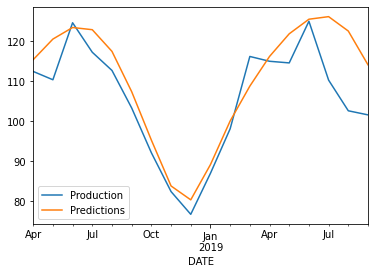

In [234]:
test.plot()

**TASK: Calculate your RMSE.**

In [235]:
from sklearn.metrics import mean_squared_error

In [236]:
np.sqrt(mean_squared_error(test['Production'],test['Predictions']))

7.926018675956336

# Multivariate Time Series with RNN

NOTE: In general, it is very difficult to get good performance from an LSTM based RNN model for multivariate series. We highly recommend using SARIMAX and VARMAX based methods if you have a real-world situation requiring multi-variate time series data. You can learn more about this in my [time series course](https://www.udemy.com/python-for-time-series-data-analysis/?couponCode=TIME_SERIES_PYTHON).

Appliance Energy Usage: A Multivariate Time Series Forecasting Example

Experimental data used to create regression models of appliances energy use in a low energy building.
Data Set Information:

The data set is at 10 min for about 4.5 months. The house temperature and humidity conditions were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for 10 minutes periods. The energy data was logged every 10 minutes with m-bus energy meters. Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis (rp5.ru), and merged together with the experimental data sets using the date and time column. Two random variables have been included in the data set for testing the regression models and to filter out non predictive attributes (parameters).
Original source of the dataset:

http://archive.ics.uci.edu/ml/datasets/Appliances+energy+prediction
___
___

In [237]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
# IGNORE THE CONTENT OF THIS CELL
# import tensorflow as tf
# tf.compat.v1.disable_eager_execution()

## Data

Let's read in the data set:

In [238]:
from google.colab import files
files.upload()

Saving energydata_complete.csv to energydata_complete.csv


{'energydata_complete.csv': b'"date","Appliances","lights","T1","RH_1","T2","RH_2","T3","RH_3","T4","RH_4","T5","RH_5","T6","RH_6","T7","RH_7","T8","RH_8","T9","RH_9","T_out","Press_mm_hg","RH_out","Windspeed","Visibility","Tdewpoint","rv1","rv2"\r\n"2016-01-11 17:00:00","  60","30","19.890000000000001","47.596666666666700","19.199999999999999","44.789999999999999","19.789999999999999","44.729999999999997","19.000000000000000","45.566666666666698","17.166666666666700","55.200000000000003"," 7.026666666666669947","84.2566666666667032","17.199999999999999","41.626666666666701","18.199999999999999","48.899999999999999","17.033333333333299","45.530000000000001"," 6.5999999999999996e+00","733.50000000000000"," 92.000000000000000"," 7.00000000000000000","63.0000000000000000"," 5.2999999999999998e+00","13.2754331571049988270","13.2754331571049988270"\r\n"2016-01-11 17:10:00","  60","30","19.890000000000001","46.693333333333300","19.199999999999999","44.722499999999997","19.789999999999999","4

In [239]:
df = pd.read_csv('energydata_complete.csv',index_col='date',
                infer_datetime_format=True)

In [240]:
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [241]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19735 entries, 2016-01-11 17:00:00 to 2016-05-27 18:00:00
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Appliances   19735 non-null  int64  
 1   lights       19735 non-null  int64  
 2   T1           19735 non-null  float64
 3   RH_1         19735 non-null  float64
 4   T2           19735 non-null  float64
 5   RH_2         19735 non-null  float64
 6   T3           19735 non-null  float64
 7   RH_3         19735 non-null  float64
 8   T4           19735 non-null  float64
 9   RH_4         19735 non-null  float64
 10  T5           19735 non-null  float64
 11  RH_5         19735 non-null  float64
 12  T6           19735 non-null  float64
 13  RH_6         19735 non-null  float64
 14  T7           19735 non-null  float64
 15  RH_7         19735 non-null  float64
 16  T8           19735 non-null  float64
 17  RH_8         19735 non-null  float64
 18  T9           19735 

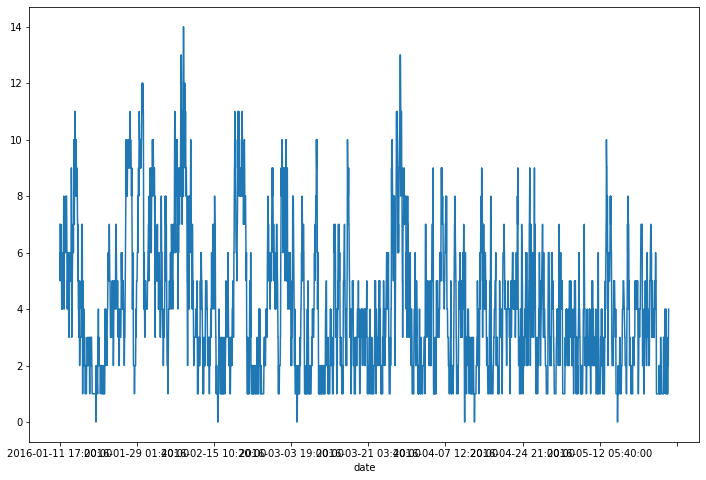

In [242]:
df['Windspeed'].plot(figsize=(12,8))

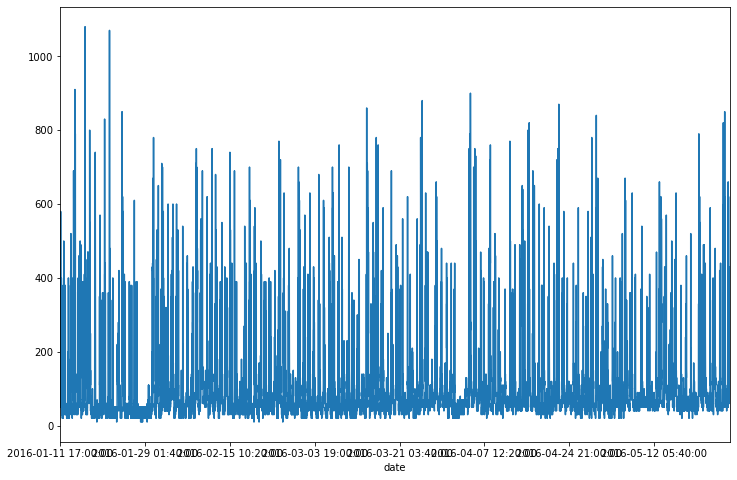

In [ ]:
df['Appliances'].plot(figsize=(12,8))

## Train Test Split

In [243]:
len(df)

19735

In [244]:
df.head(3)

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.2,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.2,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.2,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668


In [245]:
df.tail(5)

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.7,45.590000,23.20,52.400000,24.796667,1.0,24.500000,44.500000,24.7000,50.07400,23.2,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.7,45.590000,23.23,52.326667,24.196667,1.0,24.557143,44.414286,24.7000,49.79000,23.2,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.7,45.730000,23.23,52.266667,23.626667,1.0,24.540000,44.400000,24.7000,49.66000,23.2,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.7,45.790000,23.20,52.200000,22.433333,1.0,24.500000,44.295714,24.6625,49.51875,23.2,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784
2016-05-27 18:00:00,430,10,25.500000,46.600000,25.264286,42.971429,26.823333,41.156667,24.7,45.963333,23.20,52.200000,21.026667,1.0,24.500000,44.054000,24.7360,49.73600,23.2,46.8450,22.200000,755.2,57.000000,4.000000,27.000000,13.200000,34.118851,34.118851


Let's imagine we want to predict just 24 hours into the future, we don't need 3 months of data for that, so let's save some training time and only select the last months data.

In [246]:
df.loc['2016-05-01':]

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-01 00:00:00,50,0,21.200000,38.200000,18.390000,41.400000,23.200000,36.400000,19.73,37.730000,19.50,47.290000,4.800000,40.060000,19.500000,31.600000,22.2000,40.000000,19.166667,38.200000,4.300000,763.700000,86.000000,2.000000,40.000000,2.200000,15.310003,15.310003
2016-05-01 00:10:00,60,0,21.150000,38.172500,18.390000,41.500000,23.133333,36.466667,19.70,37.663333,19.50,47.290000,4.800000,40.090000,19.500000,31.600000,22.2000,40.400000,19.133333,38.290000,4.283333,763.716667,86.333333,2.166667,38.166667,2.216667,11.240067,11.240067
2016-05-01 00:20:00,50,0,21.133333,38.090000,18.323333,41.500000,23.200000,36.500000,19.70,37.590000,19.50,47.260000,4.660000,40.030000,19.500000,31.600000,22.2000,41.000000,19.133333,38.363333,4.266667,763.733333,86.666667,2.333333,36.333333,2.233333,21.808814,21.808814
2016-05-01 00:30:00,50,0,21.100000,38.090000,18.290000,41.500000,23.200000,36.500000,19.70,37.500000,19.50,47.260000,4.530000,41.300000,19.500000,31.600000,22.2000,41.333333,19.166667,38.500000,4.250000,763.750000,87.000000,2.500000,34.500000,2.250000,47.000534,47.000534
2016-05-01 00:40:00,60,0,21.100000,38.030000,18.290000,41.560000,23.200000,36.500000,19.70,37.500000,19.50,47.200000,4.590000,41.833333,19.500000,31.600000,22.2000,41.626667,19.166667,38.633333,4.233333,763.766667,87.333333,2.666667,32.666667,2.266667,8.059441,8.059441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.70,45.590000,23.20,52.400000,24.796667,1.000000,24.500000,44.500000,24.7000,50.074000,23.200000,46.790000,22.733333,755.200000,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.70,45.590000,23.23,52.326667,24.196667,1.000000,24.557143,44.414286,24.7000,49.790000,23.200000,46.790000,22.600000,755.200000,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.70,45.730000,23.23,52.266667,23.626667,1.000000,24.540000,44.400000,24.7000,49.660000,23.200000,46.790000,22.466667,755.200000,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117


In [247]:
df = df.loc['2016-05-01':]

Let's also round off the data, to one decimal point precision, otherwise this may cause issues with our network (we will also normalize the data anyways, so this level of precision isn't useful to us)

In [248]:
df = df.round(2)

In [249]:
len(df)

3853

In [250]:
# How many rows per day? We know its every 10 min
24*60/10

144.0

In [251]:
test_days = 2

In [252]:
test_ind = test_days*144

In [253]:
test_ind

288

In [254]:
# Notice the minus sign in our indexing

train = df.iloc[:-test_ind]
test = df.iloc[-test_ind:]

In [255]:
train

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-01 00:00:00,50,0,21.20,38.20,18.39,41.40,23.20,36.40,19.73,37.73,19.50,47.29,4.80,40.06,19.50,31.60,22.20,40.00,19.17,38.20,4.30,763.70,86.00,2.00,40.00,2.20,15.31,15.31
2016-05-01 00:10:00,60,0,21.15,38.17,18.39,41.50,23.13,36.47,19.70,37.66,19.50,47.29,4.80,40.09,19.50,31.60,22.20,40.40,19.13,38.29,4.28,763.72,86.33,2.17,38.17,2.22,11.24,11.24
2016-05-01 00:20:00,50,0,21.13,38.09,18.32,41.50,23.20,36.50,19.70,37.59,19.50,47.26,4.66,40.03,19.50,31.60,22.20,41.00,19.13,38.36,4.27,763.73,86.67,2.33,36.33,2.23,21.81,21.81
2016-05-01 00:30:00,50,0,21.10,38.09,18.29,41.50,23.20,36.50,19.70,37.50,19.50,47.26,4.53,41.30,19.50,31.60,22.20,41.33,19.17,38.50,4.25,763.75,87.00,2.50,34.50,2.25,47.00,47.00
2016-05-01 00:40:00,60,0,21.10,38.03,18.29,41.56,23.20,36.50,19.70,37.50,19.50,47.20,4.59,41.83,19.50,31.60,22.20,41.63,19.17,38.63,4.23,763.77,87.33,2.67,32.67,2.27,8.06,8.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-25 17:20:00,120,0,24.50,37.22,24.13,34.30,25.20,37.64,24.36,38.29,20.85,51.59,19.57,1.00,23.24,34.29,24.50,38.97,21.89,37.03,16.17,756.17,52.67,1.33,31.33,6.43,33.46,33.46
2016-05-25 17:30:00,190,0,24.50,37.16,24.10,34.30,25.20,37.55,24.29,38.16,20.89,51.59,19.26,1.00,23.20,34.29,24.39,38.79,21.89,37.20,16.25,756.15,53.50,1.50,33.50,6.75,0.43,0.43
2016-05-25 17:40:00,160,0,24.50,37.43,24.10,34.43,25.14,37.28,24.29,38.00,21.00,51.59,19.20,1.00,23.25,34.45,24.39,38.74,21.89,37.33,16.33,756.13,54.33,1.67,35.67,7.07,16.67,16.67


In [256]:
test

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-25 18:10:00,170,0,24.50,37.86,24.00,34.27,25.00,36.70,24.29,37.79,21.20,51.37,19.32,1.00,23.29,34.70,24.39,39.13,22.00,37.23,16.48,756.1,55.83,2.00,38.17,7.62,38.14,38.14
2016-05-25 18:20:00,310,0,24.50,37.30,23.86,34.33,24.94,36.67,24.29,37.79,21.29,51.14,19.39,1.00,23.32,34.76,24.41,39.62,22.00,37.36,16.47,756.1,55.67,2.00,36.33,7.53,31.16,31.16
2016-05-25 18:30:00,120,0,24.50,36.96,23.73,34.33,24.85,36.50,24.29,37.79,21.32,50.73,19.43,1.00,23.36,34.94,24.50,40.34,22.03,37.39,16.45,756.1,55.50,2.00,34.50,7.45,4.40,4.40
2016-05-25 18:40:00,120,0,24.50,37.00,23.70,34.40,24.84,36.45,24.29,37.90,21.39,50.35,19.36,1.00,23.39,35.00,24.55,40.54,22.10,37.72,16.43,756.1,55.33,2.00,32.67,7.37,27.12,27.12
2016-05-25 18:50:00,120,0,24.49,37.07,23.68,34.52,24.84,36.49,24.28,37.93,21.39,50.35,19.25,1.66,23.39,35.05,24.54,40.59,22.10,37.81,16.42,756.1,55.17,2.00,30.83,7.28,10.27,10.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-27 17:20:00,100,0,25.57,46.56,25.89,42.03,27.20,41.16,24.70,45.59,23.20,52.40,24.80,1.00,24.50,44.50,24.70,50.07,23.20,46.79,22.73,755.2,55.67,3.33,23.67,13.33,43.10,43.10
2016-05-27 17:30:00,90,0,25.50,46.50,25.75,42.08,27.13,41.22,24.70,45.59,23.23,52.33,24.20,1.00,24.56,44.41,24.70,49.79,23.20,46.79,22.60,755.2,56.00,3.50,24.50,13.30,49.28,49.28
2016-05-27 17:40:00,270,10,25.50,46.60,25.63,42.77,27.05,41.69,24.70,45.73,23.23,52.27,23.63,1.00,24.54,44.40,24.70,49.66,23.20,46.79,22.47,755.2,56.33,3.67,25.33,13.27,29.20,29.20


## Scale Data

In [257]:
from sklearn.preprocessing import MinMaxScaler

In [258]:
scaler = MinMaxScaler()

In [259]:
# IGNORE WARNING ITS JUST CONVERTING TO FLOATS
# WE ONLY FIT TO TRAININ DATA, OTHERWISE WE ARE CHEATING ASSUMING INFO ABOUT TEST SET
scaler.fit(train)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [260]:
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

## Time Series Generator

This class takes in a sequence of data-points gathered at
equal intervals, along with time series parameters such as
stride, length of history, etc., to produce batches for
training/validation.

#### Arguments
    data: Indexable generator (such as list or Numpy array)
        containing consecutive data points (timesteps).
        The data should be at 2D, and axis 0 is expected
        to be the time dimension.
    targets: Targets corresponding to timesteps in `data`.
        It should have same length as `data`.
    length: Length of the output sequences (in number of timesteps).
    sampling_rate: Period between successive individual timesteps
        within sequences. For rate `r`, timesteps
        `data[i]`, `data[i-r]`, ... `data[i - length]`
        are used for create a sample sequence.
    stride: Period between successive output sequences.
        For stride `s`, consecutive output samples would
        be centered around `data[i]`, `data[i+s]`, `data[i+2*s]`, etc.
    start_index: Data points earlier than `start_index` will not be used
        in the output sequences. This is useful to reserve part of the
        data for test or validation.
    end_index: Data points later than `end_index` will not be used
        in the output sequences. This is useful to reserve part of the
        data for test or validation.
    shuffle: Whether to shuffle output samples,
        or instead draw them in chronological order.
    reverse: Boolean: if `true`, timesteps in each output sample will be
        in reverse chronological order.
    batch_size: Number of timeseries samples in each batch
        (except maybe the last one).

In [261]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [ ]:
# scaled_train

In [262]:
# define generator
length = 144 # Length of the output sequences (in number of timesteps)
batch_size = 1 #Number of timeseries samples in each batch
generator = TimeseriesGenerator(scaled_train, scaled_train, length=length, batch_size=batch_size)

In [263]:
len(scaled_train)

3565

In [264]:
len(generator) 

3421

In [ ]:
# scaled_train

In [265]:
# What does the first batch look like?
X,y = generator[0]

In [266]:
print(f'Given the Array: \n{X.flatten()}')
print(f'Predict this y: \n {y}')

Given the Array: 
[0.03896104 0.         0.13798978 ... 0.14319527 0.75185111 0.75185111]
Predict this y: 
 [[0.03896104 0.         0.30834753 0.29439421 0.16038492 0.49182278
  0.0140056  0.36627907 0.24142857 0.24364791 0.12650602 0.36276002
  0.12       0.28205572 0.06169297 0.15759185 0.34582624 0.39585974
  0.09259259 0.39649608 0.18852459 0.96052632 0.59210526 0.1
  0.58333333 0.13609467 0.4576746  0.4576746 ]]


Now you will be able to edit the length so that it makes sense for your time series!

### Create the Model

In [267]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM

In [268]:
scaled_train.shape

(3565, 28)

In [269]:
# define model
model = Sequential()

# Simple RNN layer
model.add(LSTM(200,input_shape=(length,scaled_train.shape[1])))

# Final Prediction (one neuron per feature)
model.add(Dense(scaled_train.shape[1]))

model.compile(optimizer='adam', loss='mse')

In [270]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_15 (LSTM)               (None, 200)               183200    
_________________________________________________________________
dense_14 (Dense)             (None, 28)                5628      
Total params: 188,828
Trainable params: 188,828
Non-trainable params: 0
_________________________________________________________________


## EarlyStopping

In [271]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',patience=1)
validation_generator = TimeseriesGenerator(scaled_test,scaled_test, 
                                           length=length, batch_size=batch_size)

In [272]:
model.fit_generator(generator,epochs=10,
                    validation_data=validation_generator,
                   callbacks=[early_stop])

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
3421/3421 [==============================] - 323s 94ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 2/10
3421/3421 [==============================] - 322s 94ms/step - loss: 0.0082 - val_loss: 0.0085
Epoch 3/10
3421/3421 [==============================] - 326s 95ms/step - loss: 0.0076 - val_loss: 0.0087


In [273]:
model.history.history.keys()

dict_keys(['loss', 'val_loss'])

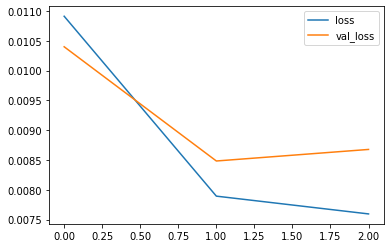

In [274]:
losses = pd.DataFrame(model.history.history)
losses.plot()

## Evaluate on Test Data

In [276]:
first_eval_batch = scaled_train[-length:]

In [277]:
first_eval_batch

array([[0.1038961 , 0.        , 0.72231687, ..., 0.53550296, 0.15909546,
        0.15909546],
       [0.11688312, 0.        , 0.73424191, ..., 0.52662722, 0.40344207,
        0.40344207],
       [0.11688312, 0.        , 0.73424191, ..., 0.51775148, 0.20452271,
        0.20452271],
       ...,
       [0.18181818, 0.        , 0.70017036, ..., 0.50118343, 0.33340004,
        0.33340004],
       [0.09090909, 0.        , 0.70017036, ..., 0.51952663, 0.78747248,
        0.78747248],
       [0.1038961 , 0.        , 0.70017036, ..., 0.53846154, 0.77286372,
        0.77286372]])

In [278]:
first_eval_batch = first_eval_batch.reshape((1, length, scaled_train.shape[1]))

In [279]:
model.predict(first_eval_batch)

array([[ 0.14625548,  0.02490784,  0.70600414,  0.40013775,  0.55906343,
         0.4302395 ,  0.43925172,  0.4605309 ,  0.6832559 ,  0.37876347,
         0.29954484,  0.33701095,  0.62659025, -0.01541179,  0.6352852 ,
         0.39503014,  0.5074707 ,  0.35023367,  0.5357681 ,  0.38380206,
         0.63725203,  0.50233144,  0.39365715,  0.19896822,  0.6037515 ,
         0.56013197,  0.45517164,  0.45946813]], dtype=float32)

In [280]:
scaled_test[0]

array([0.19480519, 0.        , 0.70017036, 0.3920434 , 0.53007217,
       0.41064526, 0.40616246, 0.41913319, 0.72714286, 0.4115245 ,
       0.30722892, 0.36445121, 0.66777778, 0.        , 0.61119082,
       0.39840637, 0.51618399, 0.32953105, 0.53703704, 0.34024896,
       0.6057377 , 0.52631579, 0.41881579, 0.2       , 0.55283333,
       0.53372781, 0.76305783, 0.76305783])

Now let's put this logic in a for loop to predict into the future for the entire test range.

----

**NOTE: PAY CLOSE ATTENTION HERE TO WHAT IS BEING OUTPUTED AND IN WHAT DIMENSIONS. ADD YOUR OWN PRINT() STATEMENTS TO SEE WHAT IS TRULY GOING ON!!**

In [281]:
n_features = scaled_train.shape[1]
test_predictions = []

first_eval_batch = scaled_train[-length:]
current_batch = first_eval_batch.reshape((1, length, n_features))

for i in range(len(test)):
    
    # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
    current_pred = model.predict(current_batch)[0]
    
    # store prediction
    test_predictions.append(current_pred) 
    
    # update batch to now include prediction and drop first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [282]:
test_predictions

[array([ 0.14625548,  0.02490784,  0.70600414,  0.40013775,  0.55906343,
         0.4302395 ,  0.43925172,  0.4605309 ,  0.6832559 ,  0.37876347,
         0.29954484,  0.33701095,  0.62659025, -0.01541179,  0.6352852 ,
         0.39503014,  0.5074707 ,  0.35023367,  0.5357681 ,  0.38380206,
         0.63725203,  0.50233144,  0.39365715,  0.19896822,  0.6037515 ,
         0.56013197,  0.45517164,  0.45946813], dtype=float32),
 array([ 0.16770858,  0.02886152,  0.7068439 ,  0.39998388,  0.5630662 ,
         0.4258358 ,  0.4473668 ,  0.4739354 ,  0.67845726,  0.370034  ,
         0.29798517,  0.3052182 ,  0.61348516, -0.02933718,  0.6450451 ,
         0.39719278,  0.49862775,  0.36598554,  0.53734374,  0.40169543,
         0.648315  ,  0.49155182,  0.37966588,  0.21492866,  0.62932694,
         0.5558084 ,  0.4533453 ,  0.45304388], dtype=float32),
 array([ 0.17627859,  0.02895581,  0.70558935,  0.4025102 ,  0.5644882 ,
         0.42298394,  0.45437413,  0.4864928 ,  0.6767721 ,  0.363727

In [283]:
scaled_test

array([[0.19480519, 0.        , 0.70017036, ..., 0.53372781, 0.76305783,
        0.76305783],
       [0.37662338, 0.        , 0.70017036, ..., 0.52840237, 0.62337402,
        0.62337402],
       [0.12987013, 0.        , 0.70017036, ..., 0.52366864, 0.08785271,
        0.08785271],
       ...,
       [0.32467532, 0.33333333, 0.87052811, ..., 0.86804734, 0.58415049,
        0.58415049],
       [0.51948052, 0.33333333, 0.87052811, ..., 0.86568047, 0.12627577,
        0.12627577],
       [0.53246753, 0.33333333, 0.87052811, ..., 0.86390533, 0.68260957,
        0.68260957]])

## Inverse Transformations and Compare

In [284]:
true_predictions = scaler.inverse_transform(test_predictions)

In [285]:
true_predictions

array([[132.61671826,   0.74723532,  24.53424432, ...,   8.06623024,
         22.75492709,  22.96962227],
       [149.13560331,   0.86584546,  24.53917377, ...,   7.99316238,
         22.66366458,  22.64860259],
       [155.73451519,   0.86867435,  24.53180951, ...,   7.88109115,
         22.54414855,  22.46326593],
       ...,
       [-24.31015968,  -2.94302568,  26.9186953 , ...,  15.97398566,
         13.57513601,  14.08801068],
       [-24.31014247,  -2.94302478,  26.9186953 , ...,  15.97398969,
         13.57513303,  14.08801217],
       [-24.31018263,  -2.94302613,  26.9186953 , ...,  15.97399372,
         13.57513303,  14.0880077 ]])

In [286]:
test

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-25 18:10:00,170,0,24.50,37.86,24.00,34.27,25.00,36.70,24.29,37.79,21.20,51.37,19.32,1.00,23.29,34.70,24.39,39.13,22.00,37.23,16.48,756.1,55.83,2.00,38.17,7.62,38.14,38.14
2016-05-25 18:20:00,310,0,24.50,37.30,23.86,34.33,24.94,36.67,24.29,37.79,21.29,51.14,19.39,1.00,23.32,34.76,24.41,39.62,22.00,37.36,16.47,756.1,55.67,2.00,36.33,7.53,31.16,31.16
2016-05-25 18:30:00,120,0,24.50,36.96,23.73,34.33,24.85,36.50,24.29,37.79,21.32,50.73,19.43,1.00,23.36,34.94,24.50,40.34,22.03,37.39,16.45,756.1,55.50,2.00,34.50,7.45,4.40,4.40
2016-05-25 18:40:00,120,0,24.50,37.00,23.70,34.40,24.84,36.45,24.29,37.90,21.39,50.35,19.36,1.00,23.39,35.00,24.55,40.54,22.10,37.72,16.43,756.1,55.33,2.00,32.67,7.37,27.12,27.12
2016-05-25 18:50:00,120,0,24.49,37.07,23.68,34.52,24.84,36.49,24.28,37.93,21.39,50.35,19.25,1.66,23.39,35.05,24.54,40.59,22.10,37.81,16.42,756.1,55.17,2.00,30.83,7.28,10.27,10.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-27 17:20:00,100,0,25.57,46.56,25.89,42.03,27.20,41.16,24.70,45.59,23.20,52.40,24.80,1.00,24.50,44.50,24.70,50.07,23.20,46.79,22.73,755.2,55.67,3.33,23.67,13.33,43.10,43.10
2016-05-27 17:30:00,90,0,25.50,46.50,25.75,42.08,27.13,41.22,24.70,45.59,23.23,52.33,24.20,1.00,24.56,44.41,24.70,49.79,23.20,46.79,22.60,755.2,56.00,3.50,24.50,13.30,49.28,49.28
2016-05-27 17:40:00,270,10,25.50,46.60,25.63,42.77,27.05,41.69,24.70,45.73,23.23,52.27,23.63,1.00,24.54,44.40,24.70,49.66,23.20,46.79,22.47,755.2,56.33,3.67,25.33,13.27,29.20,29.20


In [287]:
true_predictions = pd.DataFrame(data=true_predictions,columns=test.columns)

In [288]:
true_predictions

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,132.616718,0.747235,24.534244,38.083809,24.361521,34.928954,25.236257,37.483245,23.982791,37.067947,21.148978,49.747457,18.207937,0.109352,23.457938,34.623731,24.338853,39.620031,21.993148,38.174667,17.248950,755.553157,53.917943,1.989682,41.225089,8.066230,22.754927,22.969622
1,149.135603,0.865845,24.539174,38.079554,24.411435,34.780858,25.294199,37.736858,23.949201,36.875550,21.138622,47.867552,17.854099,-0.695396,23.525964,34.672585,24.286945,39.992878,22.001656,38.562774,17.518886,755.307381,52.854607,2.149287,42.759616,7.993162,22.663665,22.648603
2,155.734515,0.868674,24.531810,38.149407,24.429168,34.684950,25.344231,37.974444,23.937405,36.736544,21.141937,46.112431,17.589299,-1.530094,23.594356,34.706846,24.227015,40.330667,22.012588,38.935166,17.783112,755.083955,51.389296,2.309451,44.190357,7.881091,22.544149,22.463266
3,159.534807,0.771927,24.525042,38.227099,24.435892,34.638478,25.393952,38.192798,23.945859,36.655937,21.165632,44.566395,17.450073,-2.333427,23.658991,34.754285,24.170709,40.650751,22.027200,39.304471,18.080345,754.853738,49.692002,2.469676,45.649689,7.756081,22.397892,22.299183
4,162.361159,0.614625,24.522614,38.300332,24.435460,34.621489,25.441734,38.392987,23.966111,36.606695,21.203682,43.200038,17.406514,-3.121998,23.722429,34.796974,24.119302,40.935775,22.044040,39.662826,18.416740,754.623537,47.836758,2.639036,47.138029,7.617244,22.252172,22.157198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,-24.310108,-2.943022,26.918697,44.849857,31.701832,32.122435,28.515923,50.017093,28.255727,41.439240,26.515380,-10.387502,49.644200,2.546049,25.864003,43.170006,24.824548,38.319306,23.937556,49.518512,50.020959,728.915118,-1.520754,-0.008668,75.052147,15.973982,13.575139,14.088015
284,-24.310125,-2.943024,26.918695,44.849857,31.701833,32.122434,28.515925,50.017091,28.255729,41.439240,26.515383,-10.387523,49.644200,2.546058,25.864003,43.170007,24.824548,38.319304,23.937558,49.518511,50.020959,728.915116,-1.520736,-0.008668,75.052140,15.973984,13.575139,14.088014
285,-24.310160,-2.943026,26.918695,44.849857,31.701833,32.122432,28.515926,50.017088,28.255730,41.439238,26.515385,-10.387537,49.644203,2.546063,25.864004,43.170009,24.824548,38.319302,23.937559,49.518507,50.020956,728.915113,-1.520722,-0.008669,75.052125,15.973986,13.575136,14.088011
286,-24.310142,-2.943025,26.918695,44.849859,31.701835,32.122430,28.515927,50.017088,28.255732,41.439238,26.515388,-10.387555,49.644203,2.546069,25.864005,43.170010,24.824547,38.319298,23.937560,49.518504,50.020959,728.915111,-1.520704,-0.008669,75.052118,15.973990,13.575133,14.088012


to evaluate model error..we can use mse or rmse on on by slecting a feature from true predictons

### Save Model

In [289]:
from tensorflow.keras.models import load_model

In [290]:
model.save("multivariate.h5")